<a href="https://colab.research.google.com/github/tzekid/tzekid.github.io/blob/complete-rewrite/varroa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Varroa Jupyter-Notebook

Das Notebook besteht aus 5 Hauptteilen:
- Anforderungen und Hilf-Funktionen vorbereiten
- Tensorflow TFRecord Dataset aus gelabelte Masken erstellen
- Model laden und trainieren
- Model testen
- Model zum TFLite konvertieren



TODO:  
- [ ] model changes
- [ ] 

## Anforderungen und Hilf-Funktionen vorbereiten

Der Notebook wurde bisher im Google Colab (colab.research.google.com) ausgeführt, da für ca. 12€ man 24 ununterbrochenen Stunden mit ein guten CPU, 24GB RAM und einen sehr guten GPU mit 16 GB VRAM bekommt.  

Hier verknüpft man seinen eigenen Google Drive mit den Colab Notebook. 

Alternativ kann man die Notebook lokal auf eine Maschine laufen lassen, die einen NVIDIA CUDA fähiges GPU enthält. 

In [ ]:
# Verbinde mit GDrive und laufe im Ordner "Varroa_MK3"
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/My Drive/Varroa_MK3"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.activity.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fexperimentsandconfigs%20https%3a%2f%2fwww.googleapis.com%2fauth%2fphotos.native&response_type=code

Enter your authorization code:
4/1AX4XfWhf4fuN0liMBa9Ftxxk30X5hDYyNt-h_TghWeFyhOdtTpeq_BUdV9o
Mounted at /content/drive
/content/drive/My Drive/Varroa_MK3


In [ ]:
# lade Tensorflow und schaue, welche Version und GPU(s) vorhanden sind.

import tensorflow as tf
import tensorflow.keras as keras
print(f'tf: {tf.__version__}')
print(f'kr: {keras.__version__}')
print("Num GPUs Available: ", tf.config.experimental.list_physical_devices())
!python -c 'import tensorflow as tf; print(tf.__version__)' 
!python -c "import tensorflow as tf; thing = f'Default GPU Device: {tf.test.gpu_device_name()}' if tf.test.gpu_device_name() else 'Please install GPU version of TF'; print(thing);"

In [ ]:
# Model Optimisation wird später zum konvertierung des TF Models gebraucht 
!pip install -q -U git+git://github.com/tensorflow/model-optimization.git



Um den TF Model später trainieren zu können, wird "tensorflow/models" heruntergeladen und installiert.   



In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('.')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [ ]:
# Install the Object Detection API
!cd models/research/; protoc object_detection/protos/*.proto --python_out=.
!cd models/research/; rm setup.py
!cd models/research/; cp object_detection/packages/tf2/setup.py .
# !cd models/research/; cp object_detection/packages/tf1/setup.py .
!cd models/research/; python -m pip install .

In [ ]:
# imaug wird ins Training für Dataset Augmentation verwendet, um aus kleinen Dataset zu erweitern.
!pip install -q -U imgaug

     |████████████████████████████████| 948 kB 8.1 MB/s 


In [ ]:
# TODO: clean up imports

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import os
import random
import math
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf
import tensorflow_model_optimization as tfmot

from object_detection.utils import dataset_util
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage as ndi

from PIL import Image # Pillow

from skimage import (
    color, feature, filters, measure, morphology, segmentation, util
)

import cv2
import os
import random
import time

from tqdm import tqdm # pweety progress bars

from scipy import ndimage as ndi
from skimage.feature import peak_local_max

## Utilities

In [ ]:
# Farben für labeling generieren
def generate_colors():
    colors = []
    color_range = range(150,175)

    rl = list(range(40,250,20))
    gl = list(range(40,250,20))
    bl = list(range(40,250,20))

    random.shuffle(rl)
    random.shuffle(gl)
    random.shuffle(bl)

    for r in rl:
        for g in gl:
            for b in bl:
                colors.append([b,g,r])
    colors = np.array(colors)
    return colors

In [ ]:
# Ein Region Property ( regprop oder prop, mit bounding box (bbox, der die min_y, min_x, max_y Koordinaten enthält ) 
# zum canvas ( einen Bild, i.e. numpy matrix ) hinzufügen.
def add_prop_to_canvas(prop, canvas, opt_image=None):
    max_ = canvas.max()
    yo_, xo_, _, _ = prop.bbox
    
    used_image = prop.image if opt_image is None else opt_image

    for coord in prop.coords:
        y, x = coord - (yo_, xo_)
        if used_image[y,x]:
            y_, x_ = coord
            canvas[y_, x_] = max_ + 1

In [ ]:
def process_props(prop, canvas):
    # find and remove props in image
    # separate the props
    # re-add props in mask_image
    
    # if big, then split
    if prop.bbox_area > 30*30:
        image_ = prop.filled_image
        distance = ndi.distance_transform_edt(image_)
        coords = peak_local_max(distance, footprint=np.ones((1, 1)), labels=image_)
        mask = np.zeros(distance.shape, dtype=bool)
        mask[tuple(coords.T)] = True
        markers, _ = ndi.label(mask)
        labels = segmentation.watershed(-distance, markers, mask=image_)

        _colors = np.unique(labels)[1:]
        for color in _colors:
            temp_labels = labels
            temp_labels[temp_labels != color] = 0
            add_prop_to_canvas(prop, canvas, temp_labels)
    else:
        add_prop_to_canvas(prop, canvas)

In [ ]:
# die RegProps in eine Maske erkennen und es zu einen sauberen (i.e. mit 0-gefüllte) Canvas hinzufügen
# um es später zu den TFRecord Format hizufügen zu können 
def clean_mask(mask_image): # -> label
    _colors = np.unique(mask_image.reshape(-1, mask_image.shape[2]), axis=0)[1:-1] # non balck or white
    _canvas = np.all(mask_image == [255,255,255], axis=-1) # get white blobs
    _canvas = measure.label(_canvas)
    
    # clean white blobs
    _props = measure.regionprops(_canvas)
    _props = [prop for prop in _props if prop.bbox_area > 30*30]
    for prop in _props:
        process_props(prop, _canvas)
        
    for color in _colors:
        temp_canvas = np.all(mask_image == color, axis=-1)
        temp_canvas = measure.label(temp_canvas)
        reg_props = measure.regionprops(temp_canvas)
        for prop in reg_props:
            process_props(prop, _canvas)
    return _canvas

In [ ]:
# helper function for detecting timeouts
# from: https://stackoverflow.com/a/63546765/3316831

from contextlib import contextmanager
import signal
import time

@contextmanager
def timeout(duration):
    def timeout_handler(signum, frame):
        raise Exception(f'block timedout after {duration} seconds')
    signal.signal(signal.SIGALRM, timeout_handler)
    signal.alarm(duration)
    yield
    signal.alarm(0)

def sleeper(duration):
    time.sleep(duration)
    print('finished')

In [ ]:
# .npz ( gelabelte Masken im komprimierten numpy Format ) im Ordner erkennen und ausgeben
def get_npz_paths_from_dir(root_path=os.getcwd(), _ifb=True):
    result = []

    if root_path[-1] == '/':
        root_path = root_path[:-1]

    if not os.path.isdir(root_path):
        raise ValueError("ERR: Given path isn't a valid directory...")

    for root, dirs, files in os.walk(root_path):
        if ('models' in root) or ('models' in dirs):
            continue

        # print(root)

        if _ifb:
            _dq = [
                '155',
                '161',
                '164',
                '165',
                '166',
                '167',
            ]
            if (root.split('/')[-1] not in _dq):
                continue
            # else:
            #     print(root)


        for file in files:
            npz_in_name = 'npz' in file
            not_backup = '2021' not in file
            
            if npz_in_name and not_backup:
                result.append(os.path.join(root, file))
    
    return result

# test
get_npz_paths_from_dir()

['/content/drive/My Drive/Varroa_MK3/161/cam1_mask_clean_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/161/cam1_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/161/cam2_mask_clean_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/161/cam2_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/161/cam3_mask_clean_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/161/cam3_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/161/cam4_mask_clean_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/161/cam4_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/164/cam1_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/164/cam2_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/164/cam3_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/164/cam4_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/155/cam1_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/155/cam2_mask_labeled.npz',
 '/content/drive/My Drive/Varroa_MK3/155/cam3_mask_labeled.npz',
 

In [ ]:
# Hilfsfunktion um einen Bild ( Numpy Array ) schnell im Notebook darstellen
def show_im(image, bbox=None, size=15):
    figsize = (size, size)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(image)

    # Optional: einen bbox zeichnen
    if bbox != None:
        _ymin, _ymax, _xmin, _xmax = bbox
        _height = _ymax - _ymin
        _width = _xmax - _xmin 
        rect = patches.Rectangle((_xmin, _ymin), _width, _height, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show()

In [ ]:
# aus einen npz. Maske die Pixel-Koordinaten der einzelnen Varroas auslesen
def npz_to_vcoords(npz_path):
    vcoords = [] 
    
    if not os.path.isfile(npz_path):
        raise ValueError(f"ERR: Given path isn't a valid file... {npz_path}")

    _temp = np.load(npz_path)["arr_0"]
    
    label_ids = np.unique(_temp)[1:]
    for _id in label_ids:
        ys = np.where(np.any(_temp==_id, axis=0))[0]
        xs = np.where(np.any(_temp==_id, axis=1))[0]

        vcoords.append( list(zip(ys, xs)) )
    
    filepath = '/'.join(npz_path.split('/')[:-1])
    
    if 'clean' in npz_path:
        filename = npz_path.split('/')[-1][:-23] + '.jpg'
    else:
        filename = npz_path.split('/')[-1][:-17] + '.jpg'


    return filepath, filename, vcoords

In [ ]:
# Ein Bild im _shape x _shape, e.g. 512x512, Teilen brechen und die 
# zugehörigen Varroa Koordinaten berechnen und zuteilen
def break_up_image(image, vcoords = None, _shape = 512):
    segs = []
    seg_vc = []

    _ymi, _yma, _xmi, _xma = 0, 0, 0, 0

    height, width, _ = image.shape
    rows = math.ceil( height / _shape )
    cols = math.ceil( width / _shape )

    # expand image to an even number
    new_height = rows * _shape
    new_width = cols * _shape
    
    _image = np.pad(image, [(0, new_height - height), (0, new_width - width), (0, 0)], mode='constant')

    vcoord_i = 0
    for row in range(rows):
        _yma += _shape
        _xmi = 0
        _xma = 0

        for col in range(cols):
            _xma += _shape

            segs.append( _image[ _ymi:_yma, _xmi:_xma ] )
            seg_vc.append( [] )

            # if vcoords != None:
            for vcoord in vcoords: # for varroa instance
                seg_vc[vcoord_i].append( [] )

                for x, y in vcoord:
                    in_row = _ymi <= y < _yma
                    in_col = _xmi <= x < _xma

                    # debug
                    # if in_row or in_col and (not (in_row and in_col)):
                    #     print(f"{y}x{x} with [{_ymi},{_yma},{_xmi},{_xma}]")

                    if in_row and in_col:
                        seg_y = y - _ymi
                        seg_x = x - _xmi
                        seg_vc[vcoord_i][ -1 ].append( (seg_y, seg_x) )

                # remove last index if no coordinates
                # no_pixels_in_seg = seg_vc[vcoord_i][-1] == []
                too_few_pixels = len(seg_vc[vcoord_i][ -1 ]) < 12
                # if no_pixels_in_seg or too_few_pixels:
                if too_few_pixels:
                    seg_vc[vcoord_i] = seg_vc[vcoord_i][ :-1 ] # all, but the last element

            if len(seg_vc[vcoord_i]) == 0:
                segs = segs[:-1]
                seg_vc = seg_vc[:-1]
            else:
                vcoord_i += 1

            _xmi += _shape
        _ymi += _shape
    
    # # DEBUG:
    # print(f"seg_vc before no empty: {len([y for x in seg_vc for y in x])}")
    # seg_vc = [[y for y in x if y != []] for x in seg_vc]
    return segs, seg_vc

In [ ]:
# Funktion um einen TFRecord zu erstellen

import tempfile
def create_tf_example(filepath, filename, segment, vcoords, _delta = 4):
    fullpath = filepath + '/' + filename
    
    if not os.path.isfile(fullpath):
        raise ValueError(f"ERR: Given path isn't a valid file... {fullpath}")

    file_out = tempfile.NamedTemporaryFile(suffix='.jpg')
    cv2.imwrite(file_out.name, segment)

    with tf.io.gfile.GFile(file_out.name, 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    height = segment.shape[0]
    width = segment.shape[1]

    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []

    for vcoord in vcoords:
        _ymin = min( [y for y, _ in vcoord] )
        _ymax = max( [y for y, _ in vcoord] )
        _xmin = min( [x for _, x in vcoord] )
        _xmax = max( [x for _, x in vcoord] )


        # Optional: zu jeden bbox einen padding mit Größe "delta" in alle Richtungen hizufügen 
        _ymin -= _delta if (_ymin - _delta) >= 0 else 0
        _ymax += _delta if (_ymax + _delta) <= height else 0
        _xmin -= _delta if (_xmin - _delta) >= 0 else 0
        _xmax += _delta if (_xmax + _delta) <= width else 0

        ymins.append( _ymin / height )
        ymaxs.append( _ymax / height )
        xmins.append( _xmin / width )
        xmaxs.append( _xmax / width )

    image_format = b'jpg'
    classes_text = [b'varroa' for _ in range(len(xmins))]
    classes = [1 for _ in range(len(xmins))] # TODO check if correct

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename.encode('utf8')),
        'image/source_id': dataset_util.bytes_feature(fullpath.encode('utf8')),
        # 'image/raw': dataset_util.bytes_feature(img_raw),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    
    return tf_example

In [ ]:
#
#
# Haupt Loop um einen TFRecord aus .npz Daten zu erstellen.
#
#


# Ordner auswählen

# # dirs_.index("../Images/Kirchhain/129/cam4_mask.png")
# dirs_ = sorted(get_npz_paths_from_dir())#default
dirs_ = sorted(get_npz_paths_from_dir())


# # DEBUG:
# print(dirs_.index('/content/drive/My Drive/Varroa_MK3/161/cam1_mask_clean_labeled.npz'),
# dirs_.index('/content/drive/My Drive/Varroa_MK3/161/cam2_mask_clean_labeled.npz'),
# dirs_.index('/content/drive/My Drive/Varroa_MK3/161/cam3_mask_clean_labeled.npz'),
# dirs_.index('/content/drive/My Drive/Varroa_MK3/161/cam4_mask_clean_labeled.npz'))


# Ordner / einzelne NPZs selektieren
dirs_ = [
         dirs_[4], dirs_[6], dirs_[8], dirs_[10],
]

# # DEBUG:
# dirs_


record_file = 'ifb_161_test.tfrecords' # Dateinamen
with tf.io.TFRecordWriter(record_file) as writer:

    t = tqdm(dirs_, position=0, leave=True) # für schöne ProgressBar
    for npz_path in t:

        # leeren von gefüllten Bild-Teilen unterscheiden / zählen 
        empty_ones = 0
        full_ones = 0

        t.update() # update progressbar 

        filepath, filename, vcoords = npz_to_vcoords(npz_path)

        _img_path = filepath + '/' + filename
        _img = cv2.imread( _img_path )

        # segs, seg_vc = break_up_image(_img, vcoords)
        segs, seg_vc = break_up_image(_img, vcoords, _shape=512)

        # # DEBUG:
        print(f"vcoords: {len(vcoords)}",
            f" seg_vc: {len([y for x in seg_vc for y in x])}")

        for idx in range(len(seg_vc)):
            if len(seg_vc[idx]) == 0:
                empty_ones += 1
            else:
                tf_example = create_tf_example( filepath, filename, segs[idx], seg_vc[idx], _delta=0 )
                writer.write( tf_example.SerializeToString() )
                full_ones += 1
        print(f"empty: {empty_ones}",
              f"full_ones: {full_ones}")

  0%|          | 0/4 [00:00<?, ?it/s]

vcoords: 937  seg_vc: 892


 25%|██▌       | 1/4 [00:08<00:26,  8.87s/it]

empty: 0 full_ones: 33
vcoords: 330  seg_vc: 321


 50%|█████     | 2/4 [00:12<00:14,  7.18s/it]

empty: 0 full_ones: 31
vcoords: 920  seg_vc: 871


 75%|███████▌  | 3/4 [00:20<00:07,  7.51s/it]

empty: 0 full_ones: 30
vcoords: 194  seg_vc: 187


100%|██████████| 4/4 [00:22<00:00,  5.62s/it]

empty: 0 full_ones: 28


In [ ]:
#
# Hilfsfunktionen für Training und Detection
#


def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None,
                    min_score_thresh=0.5):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=min_score_thresh,
      max_boxes_to_draw=325, #)
      line_thickness=1)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

## Daten für das Training vorbereiten



In [ ]:
# raw_dataset = tf.data.TFRecordDataset('/content/drive/My Drive/NewObjectDet/varroa_train.record')
# raw_dataset = tf.data.TFRecordDataset('./debug_two.tfrecords')
# raw_dataset = tf.data.TFRecordDataset('./debug.tfrecords') #
# raw_dataset = tf.data.TFRecordDataset('./debug_nopadding.tfrecords') #default
# raw_dataset = tf.data.TFRecordDataset('./debug_512.tfrecords') #
# raw_dataset = tf.data.TFRecordDataset('./debug_ifb.tfrecords') #512

raw_dataset = tf.data.TFRecordDataset('./ifb_161_test.tfrecords') #512

# raw_dataset = tf.data.TFRecordDataset('./debug_overfit.tfrecords')
# raw_dataset = tf.data.TFRecordDataset('/content/drive/My Drive/NewObjectDet/models/research/object_detection/varroa_train.record')

image_feature_description = {
    'image/height': tf.io.FixedLenFeature([], tf.int64),
    'image/width': tf.io.FixedLenFeature([], tf.int64),
    'image/filename': tf.io.FixedLenFeature([], tf.string),
    'image/source_id': tf.io.FixedLenFeature([], tf.string),
    'image/encoded': tf.io.FixedLenFeature([], tf.string),
    'image/format': tf.io.FixedLenFeature([], tf.string),
    'image/object/bbox/xmin': tf.io.FixedLenSequenceFeature([], tf.float32, allow_missing=True),
    'image/object/bbox/xmax': tf.io.FixedLenSequenceFeature([], tf.float32, allow_missing=True),
    'image/object/bbox/ymin': tf.io.FixedLenSequenceFeature([], tf.float32, allow_missing=True),
    'image/object/bbox/ymax': tf.io.FixedLenSequenceFeature([], tf.float32, allow_missing=True),
    'image/object/class/text': tf.io.FixedLenSequenceFeature([], tf.string, allow_missing=True),
    'image/object/class/label': tf.io.FixedLenSequenceFeature([], tf.int64, allow_missing=True),
}

def _parse_image_function(example_proto):
    return tf.io.parse_single_example(example_proto, image_feature_description)
    
parsed_dataset = raw_dataset.map(_parse_image_function)


In [ ]:
import cv2

# TODO example -> tin & gtb
train_images_np = []
gt_boxes = []

# By convention, our non-background classes start counting at 1.  Given
# that we will be predicting just one class, we will therefore assign it a
# `class id` of 1.
varroa_class_id = 1
num_classes = 1

category_index = {varroa_class_id: {'id': varroa_class_id, 'name': 'varroa'}}

# Convert class labels to one-hot; convert everything to tensors.
# The `label_id_offset` here shifts all classes by a certain number of indices;
# we do this here so that the model receives one-hot labels where non-background
# classes start counting at the zeroth index.  This is ordinarily just handled
# automatically in our training binaries, but we need to reproduce it here.
label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []

scale_factor = 1024 / 512 # predict / segment

# data_augmentation = tf.keras.Sequential([
#   layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
#   layers.experimental.preprocessing.RandomRotation(0.2),
# ])

# for image_features in parsed_dataset.take(10):
# for image_features in parsed_dataset:


# record_file = 'debug.tfrecords'
# with tf.io.TFRecordWriter(record_file) as writer:
#     
#     for npz_path in t:
#         

pd_len = sum(1 for _ in parsed_dataset)
print(f"\nTotal: {pd_len}\n")
t = tqdm(parsed_dataset, position=0, leave=True)
discarded_i = 0

idx = 0
for image_features in t:
    t.update()

    # if idx != 6*12:
    #     idx+=1
    #     continue

    if len(image_features['image/object/bbox/ymax'].numpy()) < 2:
        # print("ERR image discarded")
        discarded_i += 1
        continue

    tmp_img = Image.open(io.BytesIO(image_features['image/encoded'].numpy()))

    # tmp_img = np.array(tmp_img.getdata()).reshape((896, 896, 3)).astype(np.uint8) # default
    # tmp_img = np.array(tmp_img.getdata()).reshape((512, 512, 3)).astype(np.uint8)

    # # for odd dataset
    tmp_img = np.array(tmp_img.getdata()).reshape((512, 512, 3)).astype(np.uint8)
    tmp_img = cv2.resize(tmp_img, (1024,1024), interpolation = cv2.INTER_AREA)

  # features to np(boxes)
    xmins = image_features['image/object/bbox/xmin'].numpy()
    xmaxs = image_features['image/object/bbox/xmax'].numpy()
    ymins = image_features['image/object/bbox/ymin'].numpy()
    ymaxs = image_features['image/object/bbox/ymax'].numpy()

    train_images_np.append(tmp_img)
    train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(tmp_img, dtype=tf.float32), axis=0))

    gt_box_np = np.asarray([list(x) for x in zip(ymins,xmins,ymaxs,xmaxs)])
    gt_boxes.append(gt_box_np)
    gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))

    zero_indexed_groundtruth_classes = tf.convert_to_tensor(np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
    gt_classes_one_hot_tensors.append(tf.one_hot(zero_indexed_groundtruth_classes, num_classes))

    # break


print(f"\n#images discarded: {discarded_i}\n")
print("\nDone prepping data.\n")


# for (train_image_np, gt_box_np) in zip(
#     train_images_np, gt_boxes):
#   train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(train_image_np, dtype=tf.float32), axis=0))
#   gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
#   zero_indexed_groundtruth_classes = tf.convert_to_tensor(np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
#   gt_classes_one_hot_tensors.append(tf.one_hot(zero_indexed_groundtruth_classes, num_classes))
# print('Done prepping data.')

max_varr = -1
_min = 1
_max = -1
for gt in gt_boxes:
    _min = len(gt) if len(gt) < _min else _min
    _max = len(gt) if len(gt) > _max else _max

    max_varr = _max

print(f"discarded: {discarded_i}")
print(f"total images: {len(gt_boxes)}")
print(f"total bboxes: {len([y for x in gt_boxes for y in x])}")
print(f"max instances in one segment: {max_varr}")
# print(f"{gt_boxes}")

0it [00:00, ?it/s]


Total: 122



122it [00:41,  2.96it/s]


#images discarded: 11


Done prepping data.

discarded: 11
total images: 111
total bboxes: 2260
max instances in one segment: 71


In [ ]:
#
# Code Block zum Debuggen / schauen ob alles stimmt 
# falls der Dataset nach dem Laden des TFRecords geändert sein soll.
#

max_varr = -1
_min = 1
_max = -1
for gt in gt_boxes:
    _min = len(gt) if len(gt) < _min else _min
    _max = len(gt) if len(gt) > _max else _max

    max_varr = _max

print(f"total images: {len(gt_boxes)}")
print(f"total bboxes: {len([y for x in gt_boxes for y in x])}")
print(f"max instances in one segment: {max_varr}")
# print(f"{gt_boxes}")

total images: 111
total bboxes: 2260
max instances in one segment: 71


In [ ]:
#
# Haupt CodeBlock um die geladene (rohe) Daten zu visualisieren
#


dummy_scores = np.array([1.0]*3000, dtype=np.float32)  # give boxes a score of 100%
category_index = {varroa_class_id: {'id': varroa_class_id, 'name': 'varroa'}}
offset = 0
plt.figure(figsize=(50, 50))

print(len(gt_boxes))

## 
## _d <- index range
## 
# _d = 6 * 2 + 1
# _d = 6 * 2
_d = 0


#
# hier unten unterschiedliche Index Ranges benutzt um Dataset anzuschauen 
# 
_iimg = 0
for idx in range(len(gt_boxes))[0+_d:1+_d]:
# for idx in range(len(gt_boxes))[0+_d:6+_d]:
# for idx in range(len(gt_boxes))[0+_d:]:
# for idx in range(len(gt_boxes)):
  plt.subplot(2, 3, _iimg+1)
  plot_detections(
      train_images_np[idx+offset],
      gt_boxes[idx+offset],
      np.ones(shape=[gt_boxes[idx+offset].shape[0]], dtype=np.int32),
      dummy_scores, category_index)
  
  print(gt_boxes[idx+offset])

  if _iimg < 5:
      _iimg += 1
  else:
      break
#   print(f"shape: {train_images_np.shape}")
plt.show()

## Create model and restore weights for all but last layer

In this cell we build a single stage detection architecture (RetinaNet) and restore all but the classification layer at the top (which will be automatically randomly initialized).

For simplicity, we have hardcoded a number of things in this colab for the specific RetinaNet architecture at hand (including assuming that the image size will always be 640x640), however it is not difficult to generalize to other model configurations.

In [ ]:
## Model herunterladen,
## und .tar.gz Archiv entpacken 

## Mobilenet
# !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
# !tar -xf ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz; rm ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz

## Resnet50
# !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8.tar.gz
# !tar -xf ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8.tar.gz; rm ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8.tar.gz


# !ls ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8
# !ls ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8

In [ ]:
#
#
## Model laden und Gewichte aktivieren, um es später trainieren zu können
#
#



from IPython.display import clear_output
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)
num_classes = 1
# pipeline_config = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/pipeline.config'
pipeline_config = 'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/pipeline.config'
# checkpoint_path = '/content/drive/My Drive/NewObjectDet/models/research/object_detection/efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0'

# checkpoint_path = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/ckpt-0'

# checkpoint_path = '/content/drive/MyDrive/Varroa_MK3/ckpt_varroa/ckpt-2000-104.index'
checkpoint_path = 'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/checkpoint/ckpt-0'

# checkpoint_path = '/content/drive/MyDrive/Varroa_MK3/resnet50_model/ckpt-8000-136'

# checkpoint_path = 'ckpt_varroa_four/ckpt-5000-166'

# checkpoint_path = '/content/drive/MyDrive/Varroa_MK3/ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model/ckpt-35'
# checkpoint_path = '/content/drive/MyDrive/Varroa_MK3/ckpt_varroa_long_aug/ckpt-7000-60'

# checkpoint_path = 'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model/ckpt-3'
# checkpoint_path = '/content/drive/MyDrive/Varroa_MK3/ckpt_varroa_two/ckpt-3000-6'
# checkpoint_path = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model/ckpt-2'
# checkpoint_path = '/content/drive/MyDrive/Varroa_MK3/ckpt_varroa_two/ckpt-200-53'

# Load pipeline config and build a detection model.
#
# Since we are working off of a COCO architecture which predicts 90
# class slots by default, we override the `num_classes` field here to be just
# one (for our new rubber ducky class).
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
# model_config.center_net.feature_extractor.type = "resnet_v2_50"
# model_config.center_net.num_classes = num_classes
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

clear_output()

# Set up object-based checkpoint restore --- RetinaNet has two prediction
# `heads` --- one for classification, the other for box regression.  We will
# restore the box regression head but initialize the classification head
# from scratch (we show the omission below by commenting out the line that
# we would add if we wanted to restore both heads)
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)

    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial() # first_load
# ckpt.restore(checkpoint_path)

output_checkpoint_dir = "resnet50_ifb_512_2"

# To save checkpoint for TFLite conversion.
exported_ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt_manager = tf.train.CheckpointManager(
    exported_ckpt, output_checkpoint_dir + '/checkpoint', max_to_keep=1)

clear_output()

# Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 1024, 1024, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

Weights restored!


In [ ]:
!ls 

127  170			 gif_frame_03.jpg
128  98				 ifb_161_test.tfrecords
129  ckpt_varroa		 models
130  ckpt_varroa_five		 resnet50_ifb_only
131  ckpt_varroa_four		 resnet50_model
132  ckpt_varroa_long		 resnet50_model_somegood
133  ckpt_varroa_long_aug	 resnet50_model_w_decay
134  ckpt_varroa_mobilenet	 resnet50_model_w_decay_highlr_02_tresh
135  ckpt_varroa_resnet50	 resnet50_model_w_h
136  ckpt_varroa_resnet50_biglr  resnet50_pre_tflite
137  ckpt_varroa_three		 resnet50_pre-tflite
138  ckpt_varroa_two		 resnet50.tflite
139  debug_512.tfrecords	 ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8
155  debug_ifb.tfrecords	 ssd_resnet50_export
161  debug_nopadding.tfrecords	 ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8
162  debug_overfit.tfrecords	 test_bboxes.npz
163  debug.tfrecords		 test_detections.npz
164  debug_two.tfrecords	 test_images_np.npz
165  gif_frame_00.jpg		 varroa.ipynb
166  gif_frame_01.jpg
167  gif_frame_02.jpg


In [ ]:
## DEBUG:
# m_cfg = configs['model']
# detection_model
# [var.name for var in detection_model.trainable_variables]

## Training Loop



In [ ]:
## DEBUG: 
# !rm -rf ckpt_varroa_four/ckpt*

In [ ]:
#
#
## Haupt Training Loop.
#
#
#



## Training Parameter.
## batch_size soll 2 - 4 sein.
### 2 veralgemeinert besser, dauert länger zu trainieren
### 4 umgekehrt.

## learning Rate .5e-3 oder kleiner halten.
## wird später im Training Loop geändert.
#

## num_batches, bei batch_size=4 reichen 3000 - 5000 Batches 
### bei batch_size=2 sollen es mindestens 8000 - 15000 sein. 
# 
batch_size = 2
learning_rate = .5e-3
num_batches = 42001

import imgaug as ia
import imgaug.augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

#
## Training Daten augmentieren.
## Alles zwischen die Klammer [ ] unkommentieren und 
## unten im Training Loop den zugehörigen Code Block / Loop unkommentieren  
#

seq = iaa.Sequential([
    # iaa.Fliplr(0.5), # horizontal flips #default
    # # iaa.Crop(percent=(0, 0.1)), # random crops
    # # Small gaussian blur with random sigma between 0 and 0.5.
    # # But we only blur about 50% of all images.
    # iaa.Sometimes(#default
    #     0.5,
    #     iaa.GaussianBlur(sigma=(0, 0.5))
    # ),
    # # Strengthen or weaken the contrast in each image.
    # iaa.LinearContrast((0.75, 1.5)),#default
    # # Make some images brighter and some darker.
    # # In 20% of all cases, we sample the multiplier once per channel,
    # # which can end up changing the color of the images.
    # iaa.Multiply((0.8, 1.2), per_channel=0.2),#default
], random_order=True) # apply augmenters in random order


# Select variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
# prefixes_to_train = [
#   'WeightSharedConvolutionalBoxPredictor']

prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']


for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

# Set up forward + backward pass for a single train step.
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
  """Get a tf.function for training step."""

  # Use tf.function for a bit of speed.
  # Comment out the tf.function decorator if you want the inside of the
  # function to run eagerly.
  @tf.function(experimental_relax_shapes=True)
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):
    """A single training iteration.

    Args:
      image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
        Note that the height and width can vary across images, as they are
        reshaped within this function to be 640x640.
      groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
        tf.float32 representing groundtruth boxes for each image in the batch.
      groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
        with type tf.float32 representing groundtruth boxes for each image in
        the batch.

    Returns:
      A scalar tensor representing the total loss for the input batch.
    """
    shapes = tf.constant(batch_size * [[1024, 1024, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return losses_dict['Loss/localization_loss'], losses_dict['Loss/classification_loss']

  return train_step_fn

lr_manual_decay = 0.5

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9, nesterov=True)
# optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)


## TEST_FEATURE:
# min_area = 8*8
# max_area = 42*42

_save_dir = output_checkpoint_dir
print('Start fine-tuning!', flush=True)
for idx in range(num_batches):
    # Grab keys for a random subset of examples
    all_keys = list(range(len(train_images_np)))
    random.shuffle(all_keys)
    example_keys = all_keys[:batch_size]


    # train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(tmp_img, dtype=tf.float32), axis=0))
    images_np = [train_images_np[key] for key in example_keys]
    
    im_shape = images_np[0].shape # hard-coded
    gt_boxes_list = [gt_boxes[key] for key in example_keys]
    boxes_n_ims = zip(images_np, gt_boxes_list)

    image_tensors = []
    gt_boxes_list = []
    gt_classes_list = []

    ##
    ##
    ### Augmentation Code Block START 
    ##
    ##

    # for im_np, gt_bx in boxes_n_ims:
    #     bbs = [[xmin*im_shape[1],ymin*im_shape[0],xmax*im_shape[1],ymax*im_shape[0]] for ymin,xmin,ymax,xmax in gt_bx]
    #     bbs = [BoundingBox(x1=xmin, y1=ymin, x2=xmax, y2=ymax) for xmin,ymin,xmax,ymax in bbs]
    #     bbs = [x for x in bbs if min_area <= x.area < max_area]
    #     bbs = BoundingBoxesOnImage(bbs, shape=im_np.shape)

    #     image_aug, bbs_aug = seq(image=im_np, bounding_boxes=bbs)

    #     bbs = np.array([[bb.y1/im_shape[1], bb.x1/im_shape[0], bb.y2/im_shape[1], bb.x2/im_shape[0]] for bb in bbs_aug.remove_out_of_image().clip_out_of_image()])

    #     # check if bbs count > 0 otherwise redo augmentation

    #     bbs_len = len(bbs)
    #     while bbs_len == 0:
    #         bbs = [[xmin*im_shape[1],ymin*im_shape[0],xmax*im_shape[1],ymax*im_shape[0]] for ymin,xmin,ymax,xmax in gt_bx]
    #         bbs = [BoundingBox(x1=xmin, y1=ymin, x2=xmax, y2=ymax) for xmin,ymin,xmax,ymax in bbs]
    #         bbs = [x for x in bbs if 10*10 <= x.area < 35*35]
    #         bbs = BoundingBoxesOnImage(bbs, shape=im_np.shape)

    #         image_aug, bbs_aug = seq(image=im_np, bounding_boxes=bbs)

    #         bbs_aug = BoundingBoxesOnImage([x for x in bbs_aug if min_area <= x.area < max_area], shape=im_np.shape)
    #         bbs_aug = bbs_aug.remove_out_of_image().clip_out_of_image()
    #         bbs_aug = [_x for _x in bbs_aug if np.sum(_x.extract_from_image(image_aug)) > 255*50]

    #         bbs = np.array([[bb.y1/im_shape[1], bb.x1/im_shape[0], bb.y2/im_shape[1], bb.x2/im_shape[0]] for bb in bbs_aug])
    #         bbs_len = len(bbs)
        
    #     zero_indexed_groundtruth_classes = tf.convert_to_tensor(np.ones(shape=[bbs.shape[0]], dtype=np.int32) - label_id_offset)

    #     image_tensors.append(tf.expand_dims(tf.convert_to_tensor(image_aug, dtype=tf.float32), axis=0))
    #     gt_boxes_list.append(tf.convert_to_tensor(bbs, dtype=tf.float32))
    #     gt_classes_list.append(tf.one_hot(zero_indexed_groundtruth_classes, num_classes))

    # image_tensors = [tf.expand_dims(tf.convert_to_tensor(aug['image'], dtype=tf.float32), axis=0) for aug in augmented]

    ##
    ##
    ### Augmentation Code Block END 
    ##
    ##

    if len(gt_boxes_list) == 0:
        gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
    
    
    if len(gt_classes_list) == 0:
        gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]

    if len(image_tensors) == 0:
        image_tensors = [train_image_tensors[key] for key in example_keys]

    # Training step (forward pass + backwards pass)
    loc_loss, class_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)
  

    # jede 100 Epochs... usw.
    if idx % 100 == 0:
        print('batch ' + str(idx) + ' of ' + str(num_batches)
        + ', loc_loss=' +  str(loc_loss.numpy())
        + ', class_loss=' +  str(class_loss.numpy())
        + ', total_loss=' +  str(loc_loss.numpy()+class_loss.numpy())
        # + ', learning_rate=' + str(optimizer.lr.numpy())
        ,flush=True)


    if idx != 0 and idx % 2000 == 0:
        # batch_size = 2

        learning_rate *= lr_manual_decay
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9, nesterov=True)
        # optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
        train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)
        print(f"\nlr: {learning_rate}")
            #   f"\nbs: {batch_size}\n")

        try:
            # os.mkdir(_save_dir)
            os.mkdir(output_checkpoint_dir)
        except:
            pass
        # ckpt.save(f"{_save_dir}/ckpt-{idx}")
        ckpt.save(f"{output_checkpoint_dir}/ckpt-{idx}")
        # ckpt.save()
        print(f"--- ckpt saved")

    elif idx != 0 and idx == 1000:
        # batch_size = 4

        learning_rate = .1e-2
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9, nesterov=True)
        # optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
        train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)
        print(f"\nlr: {learning_rate}")
            #   f"\nbs: {batch_size}\n")
    
    elif idx != 0 and idx % 500 == 0:
        # batch_size = 4

        learning_rate *= 1.1
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9, nesterov=True)
        # optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
        train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)
        print(f"\nlr: {learning_rate}")
            #   f"\nbs: {batch_size}\n")

    # elif idx != 0 and idx % 750 == 0:
    #     batch_size = 8
    #     print(f"\nbs: {batch_size}\n")

print('Done fine-tuning!')

In [ ]:
# Checkpoint mit Gewichten speichern, zBsp. falls der Training früh unterbrochen wurde.

output_checkpoint_dir = "resnet50_model"
# To save checkpoint for TFLite conversion.
exported_ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt_manager = tf.train.CheckpointManager(
    exported_ckpt, output_checkpoint_dir, max_to_keep=1)

## Hilfsfunktionen für Augmentation und Model Inference testen



In [ ]:
def bbox_to_iabb(bboxes):
    _bbs = [[xmin*im_shape[1],ymin*im_shape[0],xmax*im_shape[1],ymax*im_shape[0]] for ymin,xmin,ymax,xmax in bboxes]
    _bbs = [BoundingBox(x1=xmin, y1=ymin, x2=xmax, y2=ymax) for xmin,ymin,xmax,ymax in _bbs]
    _bbs = BoundingBoxesOnImage(_bbs, shape=(1024, 1024, 3))
    return _bbs

In [ ]:
def iabb_to_bbox(iabb, im_shape=(896,896)):
        return np.array([[bb.y1/im_shape[1], bb.x1/im_shape[0], bb.y2/im_shape[1], bb.x2/im_shape[0]] for bb in iabb.remove_out_of_image().clip_out_of_image()])

In [ ]:
def merge_overlapping_bboxes(iabb, _iou_tresh = 0.5):
    _iabb = [x for x in iabb]
    oldlen = -1
    newlen = len(_iabb)

    while oldlen != newlen:
        oldlen = newlen
        for idx, bba in enumerate(_iabb):
            _temp_overlaps = []
            # _temp_overlaps.append(bba)
            for bbb in _iabb:
                # if bba.iou(bbb) > _iou_tresh and bba != bbb:
                if bba.iou(bbb) > _iou_tresh:
                    # if bba.iou(bbb) != 0.0:
                    _temp_overlaps.append(bbb)
            
            _x1 = np.sum([bb.x1 for bb in _temp_overlaps]) / len(_temp_overlaps)
            _y1 = np.sum([bb.y1 for bb in _temp_overlaps]) / len(_temp_overlaps)
            _x2 = np.sum([bb.x2 for bb in _temp_overlaps]) / len(_temp_overlaps)
            _y2 = np.sum([bb.y2 for bb in _temp_overlaps]) / len(_temp_overlaps)

            [_iabb.remove(x) for x in _temp_overlaps]
            _iabb.append(BoundingBox(x1=_x1, y1=_y1, x2=_x2, y2=_y2))
            # _temp_overlaps = _temp_overlaps[1:]
            newlen = len(_iabb)
    
    return BoundingBoxesOnImage(_iabb, shape=(896,896,3))

In [ ]:
def compare_iabb(predicted_bbs, groundtruth_bbs, scores=None, _score_tresh=0.3, _iou_tresh=0.5):
    true_positive = []
    false_positive = []
    false_negative = []

    for idx, prd_bb in enumerate(predicted_bbs):
        if scores is not None:
            if scores[idx] < _score_tresh:
                continue

        for gt_bb in groundtruth_bbs:
            if prd_bb.iou(gt_bb) > _iou_tresh:
                true_positive.append(prd_bb)
        
        if prd_bb not in true_positive:
            false_positive.append(prd_bb)

    for prd_bb in predicted_bbs:
        if prd_bb not in true_positive and prd_bb not in false_positive:
            false_negative.append(prd_bb)
    
    return true_positive, false_positive, false_negative

In [ ]:
no_nulls = lambda y: [x for x in y.numpy() if list(x) != [0,0,0,0]]

In [ ]:
test_image_dir = '/content/drive/My Drive/NewObjectDet/test_img'
test_images_np = []
test_bboxes = []

# if len(test_images_np) == 0:

# TODO: grab (random?) keys from the dataset
    # # Grab keys for a random subset of examples
    # all_keys = list(range(len(train_images_np)))
    # random.shuffle(all_keys)
    # example_keys = all_keys[:batch_size]


    # # train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(tmp_img, dtype=tf.float32), axis=0))
    # images_np = [train_images_np[key] for key in example_keys]
    
    # im_shape = images_np[0].shape # hard-coded
    # gt_boxes_list = [gt_boxes[key] for key in example_keys]
    # boxes_n_ims = zip(images_np, gt_boxes_list)

for _im_idx in range(len(train_images_np)):
    # import os
    # files_path = [f for f in os.listdir(test_image_dir) if ".png" in f]
    # for fpath in files_path:
    #     test_images_np.append(np.expand_dims(load_image_into_numpy_array(f"{test_image_dir}/{fpath}"), axis=0))

    # _im_idx = 6 * 30 + 2
    # _im_idx = 0
    test_images_np.append(np.expand_dims(train_images_np[_im_idx], axis=0))
    test_bboxes.append(gt_boxes[_im_idx])
  

test_detections = np.array([])

print(len(test_images_np))

# for image_features in parsed_dataset:
#     image_np = Image.open(io.BytesIO(image_features['image/encoded'].numpy()))
#     test_images_np.append(np.expand_dims(image_np, axis=0))

# Again, uncomment this decorator if you want to run inference eagerly
@tf.function
def detect(input_tensor):
  """Run detection on an input image.

  Args:
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

fig, ax = plt.subplots(figsize=(42, 42))
# label_id_offset = 1
_d = 0
for i in range(len(test_images_np))[0+_d:1+_d]:
    input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
    detections = detect(input_tensor)

    # test_detections = np.append(test_detections, detections)

    print(len(detections['detection_boxes'][0]))
    filtered_dets = bbox_to_iabb(no_nulls(detections['detection_boxes'][0]))
    print( len(filtered_dets) )
    # filtered_dets = merge_overlapping_bboxes(filtered_dets)
    # filtered_dets = iabb_to_bbox(merge_overlapping_bboxes(filtered_dets))
    # print( len(filtered_dets) )

    q,w,e = compare_iabb(filtered_dets, bbox_to_iabb(test_bboxes[i]), scores=detections['detection_scores'][0].numpy() )
    print(f"preds: {len(filtered_dets)}")
    print(f"grdt: {len(test_bboxes[i])}")
    print(f"TP: {len(q)}")
    print(f"FP: {len(w)}")
    print(f"FN: {len(e)}")

    filtered_dets = iabb_to_bbox(merge_overlapping_bboxes(filtered_dets))#default
    # filtered_dets = iabb_to_bbox(merge_overlapping_bboxes(filtered_dets), im_shape=(512,512))
    plot_detections(
        test_images_np[i][0],
        filtered_dets,
        detections['detection_classes'][0].numpy().astype(np.uint32)
        + label_id_offset,
        detections['detection_scores'][0].numpy(),
        category_index,
        min_score_thresh=0.1)


    # plot_detections(
    #     test_images_np[i][0],
    #     test_bboxes[i],
    #     detections['detection_classes'][0].numpy().astype(np.uint32)
    #     + label_id_offset,
    #     detections['detection_scores'][0].numpy(),
    #     category_index,
    #     min_score_thresh=0.1)

# np.savez_compressed('test_images_np', a=test_images_np)
# np.savez_compressed('test_bboxes', a=test_bboxes)
# np.savez_compressed('test_detections', a=test_detections)

In [ ]:
detections['detection_boxes'][0].numpy()

In [ ]:
def norm_bbox_to_imgaug(bboxes, scale_shape = (896, 896)):
    # __bboxes = detections['detection_boxes'][0].numpy()
    bboxes = [x * scale_shape[0] for x in bboxes if x.any()] # only show non null elements

## Mobilenet Test

In [ ]:
## Der Model muss vor TFLite Konversion vorbereitet werden


!python models/research/object_detection/export_tflite_graph_tf2.py \
  --pipeline_config_path ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/pipeline.config \
  --trained_checkpoint_dir ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model \
  --output_directory resnet50_pre_tflite \
#   --add_postprocessing_op=true

2021-06-07 12:45:50.098660: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-07 12:45:52.055627: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-07 12:45:52.080788: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-07 12:45:52.081279: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.78GiB deviceMemoryBandwidth: 836.37GiB/s
2021-06-07 12:45:52.081337: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-07 12:45:52.108755: I tensorflow/stream_executor/plat

In [ ]:
### DEBUG:
## !cd /content/drive/MyDrive/NewObjectDet/models/research/object_detection/ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model; mv checkpoint checkpoint_bakbak; mv checkpoint_bak checkpoint

In [ ]:
# TFLite Model konvertieren

!tflite_convert --output_file=./resnet50.tflite \
--saved_model_dir="resnet50_pre_tflite/saved_model" \
# --output_format=TFLITE \
# --input_arrays=normalized_input_image_tensor \
# --inference_type=QUANTIZED_UINT8 \
# --output_arrays='TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3' \
# --input_shape=1,896,896,3 \
# --enable_select_tf_ops \
# --mean_values=128 \
# --std_dev_values=127 \
# --default_ranges_min=0 \
# --default_ranges_max=255 \
# --allow_custom_ops \
# --enable_v1_converter \
# --experimental_new_converter=False\
# --post_training_quantize True\
# --input_arrays=normalized_input_image_tensor \
# --input_arrays=normalized_image_tensor \
# --saved_model_dir=mobilenet_varroa_w_inputshape/saved_model/export/Servo/1596125860/ \
!ls -ahl resnet50.tflite

2021-06-07 12:47:25.491685: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-06-07 12:47:25.498862: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-07 12:47:25.501342: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1555] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.78GiB deviceMemoryBandwidth: 836.37GiB/s
2021-06-07 12:47:25.508078: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2021-06-07 12:47:25.712034: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2021-06-07 12:47:25.713788: I tensorflow/stream_executor/platfo

In [ ]:
#
## TFLite Model laden + Hilfsfunktion für Inference (detect)
#


# Again, uncomment this decorator if you want to run inference eagerly
def detect(interpreter, input_tensor):
  """Run detection on an input image.

  Args:
    interpreter: tf.lite.Interpreter
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()

  # We use the original model for pre-processing, since the TFLite model doesn't
  # include pre-processing.
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  interpreter.set_tensor(input_details[0]['index'], preprocessed_image.numpy())

  interpreter.invoke()

  boxes = interpreter.get_tensor(output_details[0]['index'])
  classes = interpreter.get_tensor(output_details[1]['index'])
  scores = interpreter.get_tensor(output_details[2]['index'])
  return boxes, classes, scores

# Load the TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="/content/drive/MyDrive/Varroa_MK3/resnet50.tflite")
interpreter.allocate_tensors()

print("SUCC Init complete")

SUCC Init complete


In [ ]:
#
## TFLite Model Inference auf den Dataset der oben geladen wurde.
#


# fig, ax = plt.subplots(figsize=(50, 50))
label_id_offset = 1
# dummy_scores = np.array([1.0]*3000, dtype=np.float32)  # give boxes a score of 100%
category_index = {varroa_class_id: {'id': varroa_class_id, 'name': 'varroa'}}

for image_features in parsed_dataset.take(1):
    # image_raw = image_features['image/encoded'].numpy()
    # display.display(display.Image(data=image_raw))

    image_np = Image.open(io.BytesIO(image_features['image/encoded'].numpy()))
    image_np = np.array(image_np.getdata()).reshape((896, 896, 3)).astype(np.uint8)
    # plt.imshow(image_np)

    input_tensor = tf.expand_dims(tf.convert_to_tensor(image_np, dtype=tf.float32), axis=0)
    # input_tensor = tf.convert_to_tensor(image_np, dtype=tf.float32)

    boxes, classes, scores = detect(interpreter, input_tensor)
    print(boxes, classes, scores)

    # plot_detections(
    #     image_np,
    #     boxes,
    #     classes.astype(np.uint32) + label_id_offset,
    #     scores,
    #     category_index,
    #     min_score_thresh=0.01)

0.0 0.0 0.0


In [ ]:
# test_image_dir = '/content/drive/My Drive/NewObjectDet/test_img'
# test_images_np = []

# import os
# files_path = [f for f in os.listdir(test_image_dir) if ".png" in f]
# for fpath in files_path:
#   test_images_np.append(np.expand_dims(load_image_into_numpy_array(f"{test_image_dir}/{fpath}"), axis=0))


# # for image_features in parsed_dataset:
# #     image_np = Image.open(io.BytesIO(image_features['image/encoded'].numpy()))
# #     test_images_np.append(np.expand_dims(image_np, axis=0))

# # Again, uncomment this decorator if you want to run inference eagerly
# @tf.function
# def detect(input_tensor):
#   """Run detection on an input image.

#   Args:
#     input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
#       Note that height and width can be anything since the image will be
#       immediately resized according to the needs of the model within this
#       function.

#   Returns:
#     A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
#       and `detection_scores`).
#   """
#   preprocessed_image, shapes = detection_model.preprocess(input_tensor)
#   prediction_dict = detection_model.predict(preprocessed_image, shapes)
#   return detection_model.postprocess(prediction_dict, shapes)

# # Note that the first frame will trigger tracing of the tf.function, which will
# # take some time, after which inference should be fast.

# fig, ax = plt.subplots(figsize=(50, 50))
# # label_id_offset = 1
# for i in range(len(test_images_np))[2:3]:
#     input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
#     detections = detect(input_tensor)

#     plot_detections(
#         test_images_np[i][0],
#         detections['detection_boxes'][0].numpy(),
#         detections['detection_classes'][0].numpy().astype(np.uint32)
#         + label_id_offset,
#         detections['detection_scores'][0].numpy(),
#         category_index,
#         min_score_thresh=0.1)

In [ ]:
# len([x for x in detections['detection_scores'][0] if x > 0.15])

29

In [ ]:
# detections['detection_scores']

## Evaluation Pipeline

In [ ]:
# (load tfrecords data) or just use tfrecords from above
# for loop over images
# inference
# show infered image vs ground truth

# TODO: look up evaluation metrics
# check predicted vs ground truth boxes -> Accuracy
# True Positives -> Check IoU -> AP
# print out stats

## EXAMPLE COCO Evaluation metrics
# Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.457
#  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.729
#  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.502
#  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.122
#  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.297
#  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.659
#  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.398
#  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.559
#  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.590
#  Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.236
#  Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.486
#  Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.746


# Überreste von alten Training Pipeline



In [ ]:
# !cd ckpt_varroa_two; mv nw checkpoint

In [ ]:

frozen_graph_path="/content/drive/MyDrive/Varroa_MK3/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model"
checkpoint_path="/content/drive/MyDrive/Varroa_MK3/ckpt_varroa_two/checkpoint"
# checkpoint_path="/content/drive/MyDrive/Varroa_MK3/ckpt_varroa_two"
pipeline_path="/content/drive/MyDrive/Varroa_MK3/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/pipeline.config"

!python ./models/research/object_detection/exporter_main_v2.py \
--input_type image_tensor \
--pipeline_config_path {pipeline_path} \
--trained_checkpoint_dir {checkpoint_path} \
--output_directory {frozen_graph_path} \
--add_postprocessing_op True \
--input_shape=1,896,896,3 

2021-06-05 15:34:43.095047: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
FATAL Flags parsing error: Unknown command line flag 'add_postprocessing_op'
Pass --helpshort or --helpfull to see help on flags.


In [ ]:
%%bash
python ./models/research/object_detection/export_tflite_graph_tf2.py \
  --pipeline_config_path ./ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/pipeline.config \
  --trained_checkpoint_dir /content/drive/MyDrive/Varroa_MK3/ckpt_varroa_two \
  --output_directory tflite

In [ ]:
frozen_graph_path="/content/drive/MyDrive/Varroa_MK3/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model"
checkpoint_path="/content/drive/MyDrive/Varroa_MK3/ckpt_varroa_two/checkpoint/ckpt-3000-56"
pipeline_path="/content/drive/MyDrive/Varroa_MK3/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/pipeline.config"

# !rm -rf {frozen_graph_path}

!python ./models/research/object_detection/export_tflite_ssd_graph.py \
--input_type normalized_input_image_tensor \
--pipeline_config_path {pipeline_path} \
--trained_checkpoint_prefix {checkpoint_path} \
--output_directory {frozen_graph_path} \
--detections_per_class 325 \
--max_detections 325 \
--input_shape=1,896,896,3 \
--inference_type=QUANTIZED_UINT8 \
# --add_postprocessing_op True \
# --input_type image_tensor \
# --input_type normalized_input_image_tensor \

2021-06-05 15:38:30.768919: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Traceback (most recent call last):
  File "./models/research/object_detection/export_tflite_ssd_graph.py", line 144, in <module>
    tf.app.run(main)
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/platform/app.py", line 40, in run
    _run(main=main, argv=argv, flags_parser=_parse_flags_tolerate_undef)
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 303, in run
    _run_main(main, args)
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 251, in _run_main
    sys.exit(main(argv))
  File "./models/research/object_detection/export_tflite_ssd_graph.py", line 140, in main
    FLAGS.max_classes_per_detection, use_regular_nms=FLAGS.use_regular_nms)
  File "/usr/local/lib/python3.7/dist-packages/object_detection/export_tflite_ssd_graph_lib.py", line 242, in export_tflite_graph
    tf.float32, shape=s

## Test .tflite model

In [ ]:
test_image_dir = 'models/research/object_detection/test_images/ducky/test/'
test_images_np = []
for i in range(1, 50):
  image_path = os.path.join(test_image_dir, 'out' + str(i) + '.jpg')
  test_images_np.append(np.expand_dims(
      load_image_into_numpy_array(image_path), axis=0))

# Again, uncomment this decorator if you want to run inference eagerly
def detect(interpreter, input_tensor):
  """Run detection on an input image.

  Args:
    interpreter: tf.lite.Interpreter
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()

  # We use the original model for pre-processing, since the TFLite model doesn't
  # include pre-processing.
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  interpreter.set_tensor(input_details[0]['index'], preprocessed_image.numpy())

  interpreter.invoke()

  boxes = interpreter.get_tensor(output_details[0]['index'])
  classes = interpreter.get_tensor(output_details[1]['index'])
  scores = interpreter.get_tensor(output_details[2]['index'])
  return boxes, classes, scores

# Load the TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="tflite/model.tflite")
interpreter.allocate_tensors()

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

label_id_offset = 1
for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  boxes, classes, scores = detect(interpreter, input_tensor)

  plot_detections(
      test_images_np[i][0],
      boxes[0],
      classes[0].astype(np.uint32) + label_id_offset,
      scores[0],
      category_index, figsize=(15, 20), image_name="gif_frame_" + ('%02d' % i) + ".jpg")

In [ ]:
imageio.plugins.freeimage.download()

anim_file = 'duckies_test.gif'

filenames = glob.glob('gif_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []
for filename in filenames:
  image = imageio.imread(filename)
  images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=5)

display(IPyImage(open(anim_file, 'rb').read()))

## via cmd tools

In [ ]:
# input_path: "/content/drive/MyDrive/Varroa_MK3/debug_two.tfrecords"
# input_path: "/content/drive/MyDrive/Varroa_MK3/debug_overfit.tfrecords"
# input_path: "/content/drive/My Drive/NewObjectDet/models/research/object_detection/varroa_train.record"
# input_path: "/content/drive/My Drive/NewObjectDet/models/research/object_detection/varroa_val.record"


  
#   data_augmentation_options {
#     random_horizontal_flip {
#     }
#   }
#   data_augmentation_options {
#     random_vertical_flip {
#     }
#   }
#   data_augmentation_options {
#       random_adjust_brightness {
#         max_delta: 0.2
#     }
#   }
#   data_augmentation_options {
#       random_adjust_contrast {
#       min_delta: 0.01
#       max_delta: 0.7
#     }
#   }
#   data_augmentation_options {
#     random_adjust_hue {
#       max_delta: 0.01
#     }
#   }
#   data_augmentation_options {
#     random_adjust_saturation {
#       min_delta: 0.01
#       max_delta: 0.7
#     }
#   }


    #   conv_hyperparams {
    #     regularizer {
    #       l2_regularizer {
    #         weight: 0.0004
    #       }
    #     }
    #     ...
    #     ...

In [ ]:
# !rm /content/drive/MyDrive/Varroa_MK3/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model/ckpt* \
#   /content/drive/MyDrive/Varroa_MK3/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model/checkpoint

!cd /content/drive/MyDrive/Varroa_MK3/ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/; \
  rm saved_model/ckpt* saved_model/checkpoint;  \
    # rm -rf train variables \
  

rm: cannot remove 'saved_model/checkpoint': No such file or directory


In [ ]:
# !python /content/drive/MyDrive/Varroa_MK3/models/research/object_detection/model_main_tf2.py --alsologtostderr \
# --model_dir="/content/drive/MyDrive/Varroa_MK3/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model" \
# --pipeline_config_path="/content/drive/MyDrive/Varroa_MK3/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/pipeline.config"

!python /content/drive/MyDrive/Varroa_MK3/models/research/object_detection/model_main_tf2.py --alsologtostderr \
--model_dir="ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model" \
--pipeline_config_path="ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/pipeline.config"
# --num_eval_steps=50 \
# --num_train_steps=1000

In [ ]:
# !cd /content/drive/MyDrive/NewObjectDet/models/research/object_detection/ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8; cp -r saved_model saved_model_bak; rm -rf saved_model/

In [ ]:
%load_ext tensorboard

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir "ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model"

<IPython.core.display.Javascript object>

In [ ]:
# !python /content/drive/MyDrive/Varroa_MK3/models/research/object_detection/exporter_main_v2.py \
# --input_type image_tensor \
# --pipeline_config_path ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/pipeline.config \
# --trained_checkpoint_dir ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model \
# --output_directory ./ssd_resnet50_export

In [ ]:
# !python models/research/object_detection/export_tflite_graph_tf2.py \
#   --pipeline_config_path ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/pipeline.config \
#   --trained_checkpoint_dir ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model \
#   --output_directory resnet50_pre-tflite

In [ ]:
!python models/research/object_detection/export_tflite_graph_tf2.py \
  --pipeline_config_path ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/pipeline.config \
  --trained_checkpoint_dir ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model \
  --output_directory resnet50_pre_tflite \
#   --add_postprocessing_op=true

2021-06-07 12:45:50.098660: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-07 12:45:52.055627: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-07 12:45:52.080788: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-07 12:45:52.081279: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.78GiB deviceMemoryBandwidth: 836.37GiB/s
2021-06-07 12:45:52.081337: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-07 12:45:52.108755: I tensorflow/stream_executor/plat

In [ ]:
# !cd /content/drive/MyDrive/NewObjectDet/models/research/object_detection/ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model; mv checkpoint checkpoint_bakbak; mv checkpoint_bak checkpoint

In [ ]:
!tflite_convert --output_file=./resnet50.tflite \
--saved_model_dir="resnet50_pre_tflite/saved_model" \
# --output_format=TFLITE \
# --input_arrays=normalized_input_image_tensor \
# --inference_type=QUANTIZED_UINT8 \
# --output_arrays='TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3' \
# --input_shape=1,896,896,3 \
# --enable_select_tf_ops \
# --mean_values=128 \
# --std_dev_values=127 \
# --default_ranges_min=0 \
# --default_ranges_max=255 \
# --allow_custom_ops \
# --enable_v1_converter \
# --experimental_new_converter=False\
# --post_training_quantize True\
# --input_arrays=normalized_input_image_tensor \
# --input_arrays=normalized_image_tensor \
# --saved_model_dir=mobilenet_varroa_w_inputshape/saved_model/export/Servo/1596125860/ \
!ls -ahl resnet50.tflite

2021-06-07 12:47:25.491685: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-06-07 12:47:25.498862: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-07 12:47:25.501342: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1555] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.78GiB deviceMemoryBandwidth: 836.37GiB/s
2021-06-07 12:47:25.508078: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2021-06-07 12:47:25.712034: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2021-06-07 12:47:25.713788: I tensorflow/stream_executor/platfo


## TFLite Inference

In [ ]:
#
## TFLite Model laden + Hilfsfunktion für Inference (detect)
#


# Again, uncomment this decorator if you want to run inference eagerly
def detect(interpreter, input_tensor):
  """Run detection on an input image.

  Args:
    interpreter: tf.lite.Interpreter
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()

  # We use the original model for pre-processing, since the TFLite model doesn't
  # include pre-processing.
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  interpreter.set_tensor(input_details[0]['index'], preprocessed_image.numpy())

  interpreter.invoke()

  boxes = interpreter.get_tensor(output_details[0]['index'])
  classes = interpreter.get_tensor(output_details[1]['index'])
  scores = interpreter.get_tensor(output_details[2]['index'])
  return boxes, classes, scores

# Load the TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="/content/drive/MyDrive/Varroa_MK3/resnet50.tflite")
interpreter.allocate_tensors()

print("SUCC Init complete")

SUCC Init complete


In [ ]:
#
## TFLite Model Inference auf den Dataset der oben geladen wurde.
#


# fig, ax = plt.subplots(figsize=(50, 50))
label_id_offset = 1
# dummy_scores = np.array([1.0]*3000, dtype=np.float32)  # give boxes a score of 100%
category_index = {varroa_class_id: {'id': varroa_class_id, 'name': 'varroa'}}

for image_features in parsed_dataset.take(1):
    # image_raw = image_features['image/encoded'].numpy()
    # display.display(display.Image(data=image_raw))

    image_np = Image.open(io.BytesIO(image_features['image/encoded'].numpy()))
    image_np = np.array(image_np.getdata()).reshape((896, 896, 3)).astype(np.uint8)
    # plt.imshow(image_np)

    input_tensor = tf.expand_dims(tf.convert_to_tensor(image_np, dtype=tf.float32), axis=0)
    # input_tensor = tf.convert_to_tensor(image_np, dtype=tf.float32)

    boxes, classes, scores = detect(interpreter, input_tensor)
    print(boxes, classes, scores)

    # plot_detections(
    #     image_np,
    #     boxes,
    #     classes.astype(np.uint32) + label_id_offset,
    #     scores,
    #     category_index,
    #     min_score_thresh=0.01)

0.0 0.0 0.0


In [ ]:
scores

0.0

## Load test images and run inference with new model!

In [ ]:
from os import listdir
from os.path import isfile, join
files_path = [f for f in listdir('/content/drive/MyDrive/NewObjectDet/test_img') if ".png" in f]
files_path.sort()
files_path

In [ ]:
# TODO: create a detection_model from the weights for evaluating / further usage

from IPython.display import clear_output
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)

num_classes = 1
# pipeline_config = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/pipeline.config'
pipeline_config = 'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/pipeline.config'
# checkpoint_path = '/content/drive/My Drive/NewObjectDet/models/research/object_detection/efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0'
# checkpoint_path = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/ckpt-0'
# checkpoint_path = '/content/drive/MyDrive/Varroa_MK3/ckpt_varroa/ckpt-2000-104.index'
# checkpoint_path = 'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/checkpoint/ckpt-0'
checkpoint_path = 'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model/ckpt-2'
# checkpoint_path = '/content/drive/MyDrive/Varroa_MK3/ckpt_varroa_two/ckpt-3000-6'
# checkpoint_path = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model/ckpt-2'
# checkpoint_path = '/content/drive/MyDrive/Varroa_MK3/ckpt_varroa_two/ckpt-200-53'

# Load pipeline config and build a detection model.
# Load pipeline config and build a detection model.
#
# Since we are working off of a COCO architecture which predicts 90
# class slots by default, we override the `num_classes` field here to be just
# one (for our new rubber ducky class).
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
# model_config.center_net.feature_extractor.type = "resnet_v2_50"
# model_config.center_net.num_classes = num_classes
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

clear_output()

# Set up object-based checkpoint restore --- RetinaNet has two prediction
# `heads` --- one for classification, the other for box regression.  We will
# restore the box regression head but initialize the classification head
# from scratch (we show the omission below by commenting out the line that
# we would add if we wanted to restore both heads)
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial() # first_load
# ckpt.restore(checkpoint_path)

clear_output()

# Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 896, 896, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

Weights restored!


In [ ]:
# # test_image_dir = 'models/research/object_detection/test_images/ducky/test/'
# # test_image_dir = '/content/drive/My Drive/NewObjectDet/test_img'
# # test_images_np = []

# # import os
# # files_path = [f for f in os.listdir(test_image_dir) if ".png" in f]
# # for fpath in files_path:
# #   test_images_np.append(np.expand_dims(load_image_into_numpy_array(f"{test_image_dir}/{fpath}"), axis=0))

# # Again, uncomment this decorator if you want to run inference eagerly
# @tf.function
# def detect(input_tensor):
#   """Run detection on an input image.

#   Args:
#     input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
#       Note that height and width can be anything since the image will be
#       immediately resized according to the needs of the model within this
#       function.

#   Returns:
#     A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
#       and `detection_scores`).
#   """
#   preprocessed_image, shapes = detection_model.preprocess(input_tensor)
#   prediction_dict = detection_model.predict(preprocessed_image, shapes)
#   return detection_model.postprocess(prediction_dict, shapes), prediction_dict, tf.reshape(shapes, [-1])

# # Note that the first frame will trigger tracing of the tf.function, which will
# # take some time, after which inference should be fast.

# # label_id_offset = 1
# # i = 0
# # for i in range(len(test_images_np)):
# #   input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
# #   detections = detect(input_tensor)

# #   plot_detections(
# #       test_images_np[i][0],
# #       detections['detection_boxes'][0],
# #       detections['detection_classes'][0].numpy().astype(np.uint32)
# #       + label_id_offset,
# #       detections['detection_scores'][0].numpy(),
# #       category_index, figsize=(30, 30))
# # plt.show()

{'image/encoded': <tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x01\x01\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x04\x03\x02\x02\x02\x02\x05\x04\x04\x03\x04\x06\x05\x06\x06\x06\x05\x06\x06\x06\x07\t\x08\x06\x07\t\x07\x06\x06\x08\x0b\x08\t\n\n\n\n\n\x06\x08\x0b\x0c\x0b\n\x0c\t\n\n\n\xff\xdb\x00C\x01\x02\x02\x02\x02\x02\x02\x05\x03\x03\x05\n\x07\x06\x07\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\xff\xc0\x00\x11\x08\x03\x80\x03\x80\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvw

In [ ]:

fig, ax = plt.subplots(figsize=(50, 50))
label_id_offset = 1
# dummy_scores = np.array([1.0]*3000, dtype=np.float32)  # give boxes a score of 100%
category_index = {varroa_class_id: {'id': varroa_class_id, 'name': 'varroa'}}

for image_features in parsed_dataset.take(1):
    # image_raw = image_features['image/encoded'].numpy()
    # display.display(display.Image(data=image_raw))

    image_np = Image.open(io.BytesIO(image_features['image/encoded'].numpy()))
    image_np = np.array(image_np.getdata()).reshape((896, 896, 3)).astype(np.uint8)
    # plt.imshow(image_np)

    image_tensor = tf.expand_dims(tf.convert_to_tensor(image_np, dtype=tf.float32), axis=0)
    
    # print(display.Image(data=image_raw))
    # xmins = image_features['image/object/bbox/xmin'].numpy()
    # xmaxs = image_features['image/object/bbox/xmax'].numpy()
    # ymins = image_features['image/object/bbox/ymin'].numpy()
    # ymaxs = image_features['image/object/bbox/ymax'].numpy()
    # print(len(image_features['image/object/bbox/ymax'].numpy()))

    # bboxes = np.asarray([list(x) for x in zip(xmins,xmaxs,ymins,ymaxs)])
    # print(bboxes)
    
    input_tensor = tf.convert_to_tensor(image_tensor, dtype=tf.float32)
    detections = detect(input_tensor)

    plot_detections(
        image_np,
        detections['detection_boxes'][0].numpy(),
        detections['detection_classes'][0].numpy().astype(np.uint32)
        + label_id_offset,
        detections['detection_scores'][0].numpy(),
        category_index,
        min_score_thresh=0.015)
    
    # print(preprocessed_image[0].shape)
    # plt.imshow(preprocessed_image[0])


In [ ]:
detections['detection_scores']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(896, 896, 3)


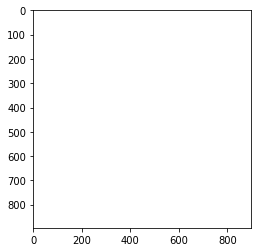

In [ ]:
# image_dir = '/content/drive/My Drive/NewObjectDet/test_img'
# image_path = os.path.join(image_dir, 'cam_12.png')
# image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
# detections, predictions_dict, shapes = detect(input_tensor)
preprocessed_image, shapes = detection_model.preprocess(input_tensor)
# plt.figure(figsize=(42, 42))
print(preprocessed_image[0].shape)
plt.imshow(preprocessed_image[0])

In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

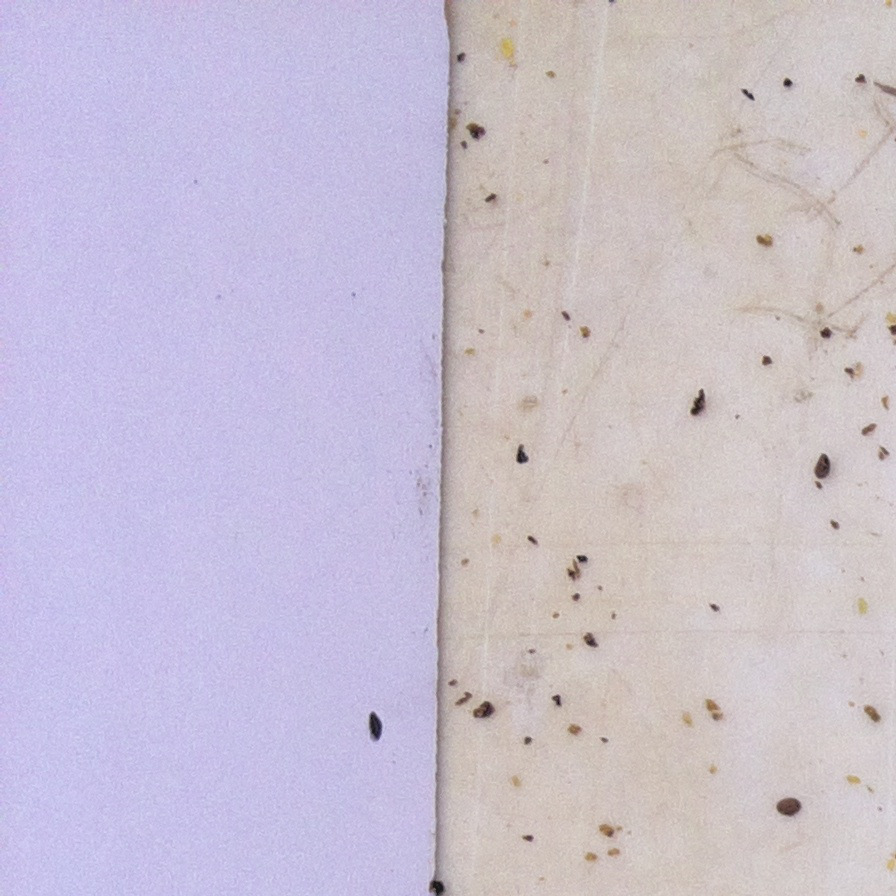

In [ ]:
# TEST Overfit Model on the one image ...
# image_np = train_images_np[0]

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.01,
      line_thickness=1,
      agnostic_mode=False)

# plt.figure(figsize=(15,15))
# plt.imshow(image_np_with_detections)
# plt.show()

In [ ]:
detections

{'detection_anchor_indices': <tf.Tensor: shape=(1, 325), dtype=int32, numpy=
 array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0,

In [ ]:
# image_dir = '/content/drive/My Drive/NewObjectDet/test_img'
# image_path = os.path.join(image_dir, 'cam_12.png')

# tmp_img = Image.open(image_path)
# tmp_img = np.array(tmp_img.getdata()).reshape((807, 807, 3)).astype(np.uint8)
# image_np = cv2.resize(tmp_img, (896,896), interpolation = cv2.INTER_AREA)


input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
keypoints, keypoint_scores = None, None
if 'detection_keypoints' in detections:
  keypoints = detections['detection_keypoints'][0].numpy()
  keypoint_scores = detections['detection_keypoint_scores'][0].numpy()

In [ ]:

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.1,
      line_thickness=1,
      agnostic_mode=False)

plt.figure(figsize=(100,100))
plt.imshow(image_np_with_detections)
plt.show()

In [ ]:
detections['detection_scores'] 

<tf.Tensor: shape=(1, 325), dtype=float32, numpy=
array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.

In [ ]:
%time preprocessed_image, shapes = detection_model.preprocess(input_tensor)

In [ ]:
plt.imshow(preprocessed_image[0])

In [ ]:
detection_model.build(shapes)

In [ ]:
detection_model.built

In [ ]:
tf.keras.models.save_model(detection_model, 'effnetD0_butts')

In [ ]:
try:
    os.mkdir('effnetD0_tits/ckpt')
except:
    pass
ckpt.save('effnetD0_tits/ckpt/checkpoint')

'effnetD0_tits/ckpt/checkpoint-11'

In [ ]:
!echo $(pwd); ls -ahl